Install libraries and modules

In [0]:
import pandas as pd
from pyspark.sql.functions import *
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import seaborn as sb
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

Data ingestion

In [0]:
# File location and type
file_location = "/FileStore/tables/olist_orders_dataset.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df_orders = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

In [0]:
# File location and type
file_location = "/FileStore/tables/olist_order_payments_dataset.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df_payments = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

In [0]:
# File location and type
file_location = "/FileStore/tables/olist_customers_dataset.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df_customers = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

Reading the datasets
- orders
- payments
- customer

In [0]:
display(df_orders)

order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
a4591c265e18cb1dcee52889e2d8acc3,503740e9ca751ccdda7ba28e9ab8f608,delivered,2017-07-09 21:57:05,2017-07-09 22:10:13,2017-07-11 14:58:04,2017-07-26 10:57:55,2017-08-01 00:00:00
136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,null,null,2017-05-09 00:00:00
6514b8ad8028c9f2cc2374ded245783f,9bdf08b4b3b52b5526ff42d37d47f222,delivered,2017-05-16 13:10:30,2017-05-16 13:22:11,2017-05-22 10:07:46,2017-05-26 12:55:51,2017-06-07 00:00:00
76c6e866289321a7c93b82b54852dc33,f54a9f0e6b351c431402b8461ea51999,delivered,2017-01-23 18:29:09,2017-01-25 02:50:47,2017-01-26 14:16:31,2017-02-02 14:08:10,2017-03-06 00:00:00
e69bfb5eb88e0ed6a785585b27e16dbf,31ad1d1b63eb9962463f764d4e6e0c9d,delivered,2017-07-29 11:55:02,2017-07-29 12:05:32,2017-08-10 19:45:24,2017-08-16 17:14:30,2017-08-23 00:00:00


In [0]:
display(df_payments)

order_id,payment_sequential,payment_type,payment_installments,payment_value
b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
298fcdf1f73eb413e4d26d01b25bc1cd,1,credit_card,2,96.12
771ee386b001f06208a7419e4fc1bbd7,1,credit_card,1,81.16
3d7239c394a212faae122962df514ac7,1,credit_card,3,51.84
1f78449c87a54faf9e96e88ba1491fa9,1,credit_card,6,341.09
0573b5e23cbd798006520e1d5b4c6714,1,boleto,1,51.95


In [0]:
display(df_customers)

customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC
fd826e7cf63160e536e0908c76c3f441,addec96d2e059c80c30fe6871d30d177,4534,sao paulo,SP
5e274e7a0c3809e14aba7ad5aae0d407,57b2a98a409812fe9618067b6b8ebe4f,35182,timoteo,MG
5adf08e34b2e993982a47070956c5c65,1175e95fb47ddff9de6b2b06188f7e0d,81560,curitiba,PR
4b7139f34592b3a31687243a302fa75b,9afe194fb833f79e300e37e580171f22,30575,belo horizonte,MG


Join the datasets

In [0]:
df = df_orders.join(df_payments, df_orders.order_id == df_payments.order_id, 'inner') \
     .join(df_customers,df_orders.customer_id == df_customers.customer_id, 'inner') \
     .select(df_orders.order_id, df_customers.customer_unique_id,df_orders.order_purchase_timestamp,df_payments.payment_value)
display(df)

order_id,customer_unique_id,order_purchase_timestamp,payment_value
e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,18.59
e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,2.0
e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,18.12
53cdb2fc8bc7dce0b6741e2150273451,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,141.46
47770eb9100c2d0c44946d9cf07ec65d,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,179.12
949d5b44dbf5de918fe9c16f97b45f8a,7c142cf63193a1473d2e66489a9ae977,2017-11-18 19:28:06,72.2
ad21c59c0840e6cb83a9ceb5573f8159,72632f0f9dd73dfee390c9b22eb56dd6,2018-02-13 21:18:39,28.62
a4591c265e18cb1dcee52889e2d8acc3,80bb27c7c16e8f973207a5086ab329e2,2017-07-09 21:57:05,175.26
136cce7faa42fdb2cefd53fdc79a6098,36edbb3fb164b1f16485364b6fb04c73,2017-04-11 12:22:08,65.95
6514b8ad8028c9f2cc2374ded245783f,932afa1e708222e5821dac9cd5db4cae,2017-05-16 13:10:30,75.16


In [0]:
df.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- customer_unique_id: string (nullable = true)
 |-- order_purchase_timestamp: string (nullable = true)
 |-- payment_value: double (nullable = true)



In [0]:
#get the date of purchase starting from the timestamp
df = df.withColumn('order_purchase_date', col('order_purchase_timestamp').cast('date'))
display(df)

order_id,customer_unique_id,order_purchase_timestamp,payment_value,order_purchase_date
e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,18.59,2017-10-02
e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,2.0,2017-10-02
e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,18.12,2017-10-02
53cdb2fc8bc7dce0b6741e2150273451,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,141.46,2018-07-24
47770eb9100c2d0c44946d9cf07ec65d,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,179.12,2018-08-08
949d5b44dbf5de918fe9c16f97b45f8a,7c142cf63193a1473d2e66489a9ae977,2017-11-18 19:28:06,72.2,2017-11-18
ad21c59c0840e6cb83a9ceb5573f8159,72632f0f9dd73dfee390c9b22eb56dd6,2018-02-13 21:18:39,28.62,2018-02-13
a4591c265e18cb1dcee52889e2d8acc3,80bb27c7c16e8f973207a5086ab329e2,2017-07-09 21:57:05,175.26,2017-07-09
136cce7faa42fdb2cefd53fdc79a6098,36edbb3fb164b1f16485364b6fb04c73,2017-04-11 12:22:08,65.95,2017-04-11
6514b8ad8028c9f2cc2374ded245783f,932afa1e708222e5821dac9cd5db4cae,2017-05-16 13:10:30,75.16,2017-05-16


Performing RFM Analysis - Recency - Frequency - Monetary

In [0]:
df_aggr = df.groupBy("customer_unique_id") \
      .agg(
           round(sum("payment_value")).alias("monetary"), \
           count("order_id").alias("frequency"), \
           max("order_purchase_date").alias("most_recent_order")
           )
display(df_aggr)

customer_unique_id,monetary,frequency,most_recent_order
969cdc8af5b07074766e79c1e6d76c24,135.0,1,2018-05-07
f2a9bc9a1db05c873e1419654f747f9e,122.0,1,2018-07-31
d0c5e56e04e886e73c79b3b71f0d6f0b,79.0,1,2017-07-08
5f03b965e26e79a371d229cfeeb578d7,54.0,1,2017-06-20
14a188558af6cd5bc222ca773d395a7f,245.0,2,2018-03-07
ef1c2fafea5285a4bfb61386bc5e3154,236.0,1,2018-08-20
d339ed835c9d8fd6b1e3c5cb60850bc5,262.0,1,2017-02-10
39d6e50625a51a618c2cf02a026231c1,67.0,1,2017-08-10
8d2fa65d968da66afc05f2e28250c9dc,151.0,1,2018-03-06
d04921557f1cde4963c30a11dfb1719d,156.0,1,2018-08-23


In [0]:
#get the max date of purchase 
max_purchase_date = df.agg({"order_purchase_date": "max"}).collect()[0][0]
max_purchase_date = to_date(lit(max_purchase_date),'yyyy-MM-dd')
#compute recency column MAX_PURCHASE_DATE - MOST_RECENT_ORDER (days)
df_aggr = df_aggr.withColumn("recency",datediff(to_date(lit(max_purchase_date),'yyyy-MM-dd'),col("most_recent_order")))
display(df_aggr)

customer_unique_id,monetary,frequency,most_recent_order,recency
969cdc8af5b07074766e79c1e6d76c24,135.0,1,2018-05-07,163
f2a9bc9a1db05c873e1419654f747f9e,122.0,1,2018-07-31,78
d0c5e56e04e886e73c79b3b71f0d6f0b,79.0,1,2017-07-08,466
5f03b965e26e79a371d229cfeeb578d7,54.0,1,2017-06-20,484
14a188558af6cd5bc222ca773d395a7f,245.0,2,2018-03-07,224
ef1c2fafea5285a4bfb61386bc5e3154,236.0,1,2018-08-20,58
d339ed835c9d8fd6b1e3c5cb60850bc5,262.0,1,2017-02-10,614
39d6e50625a51a618c2cf02a026231c1,67.0,1,2017-08-10,433
8d2fa65d968da66afc05f2e28250c9dc,151.0,1,2018-03-06,225
d04921557f1cde4963c30a11dfb1719d,156.0,1,2018-08-23,55


In [0]:
df_aggr.write.mode("overwrite").saveAsTable("TAB_AGGR")

In [0]:
%sql
select *
from TAB_AGGR
WHERE frequency = 0

customer_unique_id,monetary,frequency,most_recent_order,recency


In [0]:
df_rfm = df_aggr.toPandas()
df_rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96095 entries, 0 to 96094
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  96095 non-null  object 
 1   monetary            96095 non-null  float64
 2   frequency           96095 non-null  int64  
 3   most_recent_order   96095 non-null  object 
 4   recency             96095 non-null  int32  
dtypes: float64(1), int32(1), int64(1), object(2)
memory usage: 3.3+ MB


In [0]:
df_rfm = df_rfm.drop(df_rfm[(df_rfm.frequency == 0)].index)
df_rfm = df_rfm.drop(df_rfm[(df_rfm.recency == 0)].index)
df_rfm = df_rfm.drop(df_rfm[(df_rfm.monetary == 0)].index)

Check the skewness for RFM

Out[78]: <AxesSubplot:xlabel='frequency', ylabel='Count'>

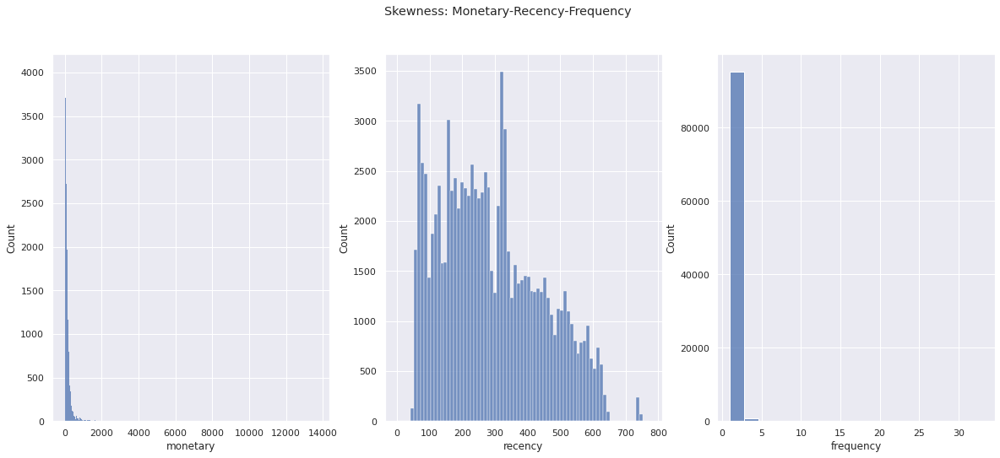

In [0]:
sb.set(rc={"figure.figsize": (20, 8)})
fig,axes=plt.subplots(1,3)
fig.suptitle('Skewness: Monetary-Recency-Frequency')
sb.histplot(df_rfm['monetary'],ax = axes[0])
sb.histplot(df_rfm['recency'],ax = axes[1])
sb.histplot(df_rfm['frequency'],ax = axes[2])

The data is highly skewed for monetary and frequency, therefore we will perform log transformations to reduce the skewness of each variable. I added a small constant as log transformation demands all the values to be positive.

In [0]:
df_rfm['monetary_trf'] = np.log(df_rfm['monetary'])
df_rfm['recency_trf'] = np.log(df_rfm['recency'])
df_rfm['frequency_trf'] = np.log(df_rfm['frequency'])

In [0]:
display(df_rfm)

customer_unique_id,monetary,frequency,most_recent_order,recency,monetary_trf,recency_trf,frequency_trf
969cdc8af5b07074766e79c1e6d76c24,135.0,1,2018-05-07,163,4.90527477843843,5.093750200806762,0.0
f2a9bc9a1db05c873e1419654f747f9e,122.0,1,2018-07-31,78,4.804021044733257,4.356708826689592,0.0
d0c5e56e04e886e73c79b3b71f0d6f0b,79.0,1,2017-07-08,466,4.3694478524670215,6.144185634125646,0.0
5f03b965e26e79a371d229cfeeb578d7,54.0,1,2017-06-20,484,3.9889840465642745,6.182084906716632,0.0
14a188558af6cd5bc222ca773d395a7f,245.0,2,2018-03-07,224,5.501258210544727,5.4116460518550396,0.6931471805599453
ef1c2fafea5285a4bfb61386bc5e3154,236.0,1,2018-08-20,58,5.4638318050256105,4.060443010546419,0.0
d339ed835c9d8fd6b1e3c5cb60850bc5,262.0,1,2017-02-10,614,5.568344503761097,6.419994928147142,0.0
39d6e50625a51a618c2cf02a026231c1,67.0,1,2017-08-10,433,4.204692619390966,6.07073772800249,0.0
8d2fa65d968da66afc05f2e28250c9dc,151.0,1,2018-03-06,225,5.017279836814924,5.41610040220442,0.0
d04921557f1cde4963c30a11dfb1719d,156.0,1,2018-08-23,55,5.049856007249537,4.007333185232471,0.0


Out[104]: <AxesSubplot:xlabel='frequency_trf', ylabel='Count'>

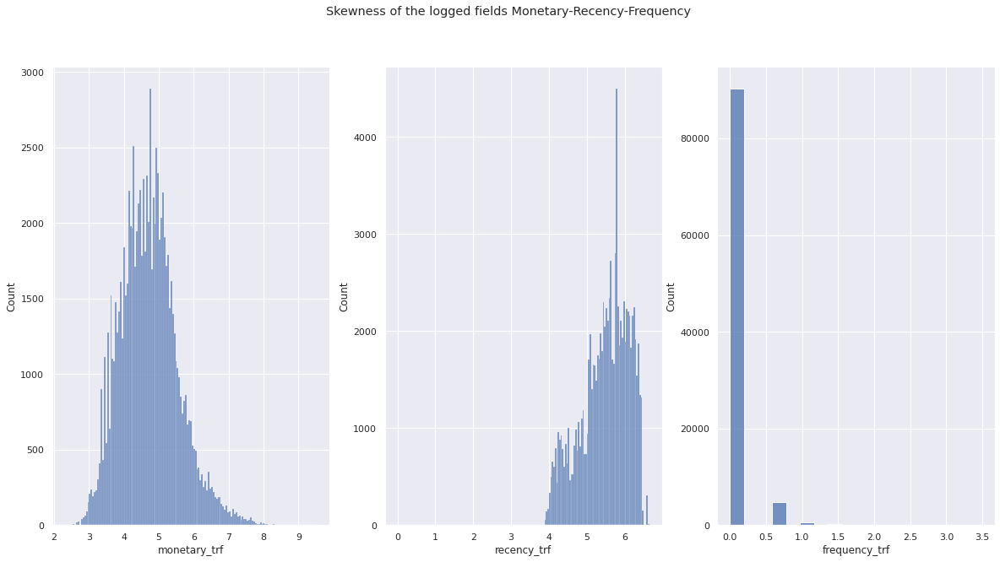

In [0]:
sb.set(rc={"figure.figsize": (20, 10)})
fig,axes=plt.subplots(1,3)
fig.suptitle('Skewness of the logged fields Monetary-Recency-Frequency')
sb.histplot(df_rfm['monetary_trf'],ax = axes[0])
sb.histplot(df_rfm['recency_trf'],ax = axes[1])
sb.histplot(df_rfm['frequency_trf'],ax = axes[2])

Scaling the fields Recency - Monetary and Frequency in order to obtain the same magnitude

Using RobustScaler in order to be not sensitive to outliers

IQR = 75th quantile — 25th quantile

X_scaled = (X — X.median) / IQR

In [0]:
scaler = MinMaxScaler()
features = ["monetary_scaled", "frequency_scaled", "recency_scaled"]
df_rfm['monetary_scaled'] = df_rfm['monetary_trf']
df_rfm['frequency_scaled'] = df_rfm['frequency_trf']
df_rfm['recency_scaled'] = df_rfm['recency_trf']
df_rfm[features] = scaler.fit_transform(df_rfm[features])
display(df_rfm)

customer_unique_id,monetary,frequency,most_recent_order,recency,monetary_trf,recency_trf,frequency_trf,monetary_scaled,frequency_scaled,recency_scaled
969cdc8af5b07074766e79c1e6d76c24,135.0,1,2018-05-07,163,4.90527477843843,5.093750200806762,0.0,0.36048659014771506,0.0,0.7659453330591774
f2a9bc9a1db05c873e1419654f747f9e,122.0,1,2018-07-31,78,4.804021044733257,4.356708826689592,0.0,0.3464624007073706,0.0,0.6551166943310439
d0c5e56e04e886e73c79b3b71f0d6f0b,79.0,1,2017-07-08,466,4.3694478524670215,6.144185634125646,0.0,0.2862716645140489,0.0,0.9238989205168353
5f03b965e26e79a371d229cfeeb578d7,54.0,1,2017-06-20,484,3.9889840465642745,6.182084906716632,0.0,0.23357537081775065,0.0,0.9295978201139938
14a188558af6cd5bc222ca773d395a7f,245.0,2,2018-03-07,224,5.501258210544727,5.4116460518550396,0.6931471805599453,0.44303351705415844,0.19823986317056055,0.8137472145630522
ef1c2fafea5285a4bfb61386bc5e3154,236.0,1,2018-08-20,58,5.4638318050256105,4.060443010546419,0.0,0.43784975758312933,0.0,0.6105673131729552
d339ed835c9d8fd6b1e3c5cb60850bc5,262.0,1,2017-02-10,614,5.568344503761097,6.419994928147142,0.0,0.4523253312963506,0.0,0.9653722620121942
39d6e50625a51a618c2cf02a026231c1,67.0,1,2017-08-10,433,4.204692619390966,6.07073772800249,0.0,0.2634521741565425,0.0,0.9128545860480799
8d2fa65d968da66afc05f2e28250c9dc,151.0,1,2018-03-06,225,5.017279836814924,5.41610040220442,0.0,0.37599989617080504,0.0,0.8144170135770239
d04921557f1cde4963c30a11dfb1719d,156.0,1,2018-08-23,55,5.049856007249537,4.007333185232471,0.0,0.38051187186491825,0.0,0.6025812083905959


K-means clustering

Out[106]: <AxesSubplot:>

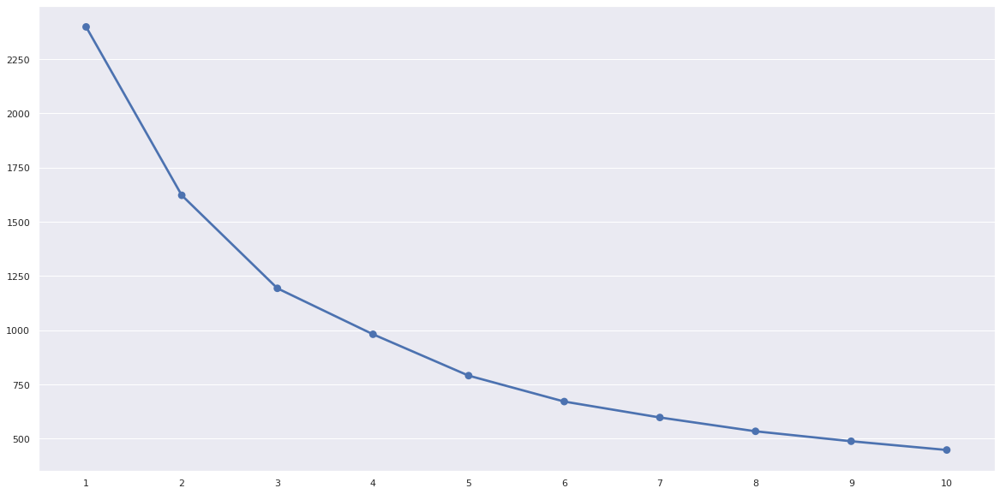

In [0]:
import seaborn as sb
import matplotlib as plt
from sklearn.cluster import KMeans
SSE = []

X = df_rfm[['monetary_scaled', 'recency_scaled', 'frequency_scaled']]

for k in range(0,10):
  kmeans = KMeans(n_clusters = k+1,random_state = 42).fit(X)
  SSE.append(kmeans.inertia_)
sb.pointplot(x=list(range(1,11)),y = SSE)

In [0]:
kmeans = KMeans(n_clusters = 5,random_state = 42)
df_rfm['cluster'] = kmeans.fit_predict(X)

In [0]:
df_rfm.describe()

,monetary,frequency,recency,monetary_scaled,frequency_scaled,recency_scaled,cluster
count,96095.000000,96095.000000,96095.000000,9.609500e+04,9.609500e+04,9.609500e+04,96095.000000
mean,166.604537,1.081076,288.103866,4.850575e-17,-1.396019e-16,-4.303407e-17,0.504365
std,231.430597,0.462548,153.411050,1.000005e+00,1.000005e+00,1.000005e+00,0.654262
min,0.000000,1.000000,0.000000,-7.198936e-01,-1.752824e-01,-1.877996e+00,0.000000
25%,63.000000,1.000000,164.000000,-4.476723e-01,-1.752824e-01,-8.089672e-01,0.000000
50%,108.000000,1.000000,269.000000,-2.532286e-01,-1.752824e-01,-1.245280e-01,0.000000
75%,184.000000,1.000000,397.000000,7.516531e-02,-1.752824e-01,7.098361e-01,1.000000
max,13664.000000,33.000000,773.000000,5.832187e+01,6.900715e+01,3.160781e+00,3.000000


In [0]:
import plotly.express as px
fig = px.scatter_3d(df_rfm, 
                    x='recency_scaled', 
                    y='frequency_scaled', 
                    z='monetary_scaled',
                    color='cluster',
                    hover_data = ['monetary','frequency','recency'],
                    opacity=0.4)
fig.show()